The previous dataset I was working with was samll (202 images total). This caused quick overfitting.
Now, I am using a different dataset from Microsoft: https://www.kaggle.com/datasets/shaunthesheep/microsoft-catsvsdogs-dataset/data. This dataset has 25000 images (50% cats and 50% dogs).

I copied this data to my Workstation to the folder /home/semc/Aygul_DL/Deep-learning/kaggle and uploaded it here.

In [1]:
import os

file_name = "/home/semc/Aygul_DL/Deep-learning/kaggle/archive_dataset2.zip"  # location and name of data file
file_size = os.path.getsize(file_name)

print(f'User uploaded file "{file_name}" with length {file_size} bytes')

User uploaded file "/home/semc/Aygul_DL/Deep-learning/kaggle/archive_dataset2.zip" with length 825979578 bytes


In [2]:
cd /home/semc/Aygul_DL/Deep-learning/kaggle

/home/semc/Aygul_DL/Deep-learning/kaggle


In [3]:
# Unzip the dataset (aldeary upzipped)
#!unzip archive_dataset2.zip

In [4]:
ls

 archive_dataset2.zip
 model5_with_augmentation_lr0_0001.pth
 model5_with_augmentation_lr0_001.pth
 model5_with_augmentation_lr0_1.pth
 model6_with_augmentation_noBatchnorm_lr0_001.pth
 model7_NoAugmentation_noBatchnorm_lr0_001.pth
 model8_NoAugmentation_noBatchnorm_noDropoutLayers_lr0_001.pth
 model9_NoAugmentation_noBatchnorm_noDropoutLayers_noEarlyStop_lr0_001.pth
 model_no_augmentation.pth
 model_with_augmentation_1.pth
 model_with_augmentation_lr0_000001.pth
 model_with_augmentation_lr0_00001.pth
 model_with_augmentation_lr0_0001a.pth
 model_with_augmentation_lr0_001a.pth
 model_with_augmentation_lr0_001.pth
 model_with_augmentation_lr0_01.pth
 model_with_augmentation_lr0_1.pth
 model_with_augmentation_noBatchnorm_lr0_001.pth
'MSR-LA - 3467.docx'
 PetImages/
'readme[1].txt'


In [5]:
# Open the file for reading
with open("readme[1].txt", "r") as f:
    # Read the contents of the file
    contents = f.read()

# Print the contents of the file
print(contents)

For information see http://research.microsoft.com/en-us/projects/asirra/corpus.aspx

Contact: jelson



In [6]:
cd PetImages/

/home/semc/Aygul_DL/Deep-learning/kaggle/PetImages


In [7]:
ls

Cat/  Dog/


In [8]:
cd Cat/

/home/semc/Aygul_DL/Deep-learning/kaggle/PetImages/Cat


In [9]:
ls

0.jpg      11877.jpg  2501.jpg  4378.jpg  6253.jpg  8129.jpg
10000.jpg  11878.jpg  2502.jpg  4379.jpg  6254.jpg  812.jpg
10001.jpg  11879.jpg  2503.jpg  437.jpg   6255.jpg  8130.jpg
10002.jpg  1187.jpg   2504.jpg  4380.jpg  6256.jpg  8131.jpg
10003.jpg  11880.jpg  2505.jpg  4381.jpg  6257.jpg  8132.jpg
10004.jpg  11881.jpg  2506.jpg  4382.jpg  6258.jpg  8133.jpg
10005.jpg  11882.jpg  2507.jpg  4383.jpg  6259.jpg  8134.jpg
10006.jpg  11883.jpg  2508.jpg  4384.jpg  625.jpg   8135.jpg
10007.jpg  11884.jpg  2509.jpg  4385.jpg  6260.jpg  8136.jpg
10008.jpg  11885.jpg  250.jpg   4386.jpg  6261.jpg  8137.jpg
10009.jpg  11886.jpg  2510.jpg  4387.jpg  6262.jpg  8138.jpg
1000.jpg   11887.jpg  2511.jpg  4388.jpg  6263.jpg  8139.jpg
10010.jpg  11888.jpg  2512.jpg  4389.jpg  6264.jpg  813.jpg
10011.jpg  11889.jpg  2513.jpg  438.jpg   6265.jpg  8140.jpg
10012.jpg  1188.jpg   2514.jpg  4390.jpg  6266.jpg  8141.jpg
10013.jpg  11890.jpg  2515.jpg  4391.jpg  6267.jpg  8142.jpg
10014.jpg  11891.jpg  2516

So, images are in jpg format. They are stored in 2 folders 'Cat' and 'Dog'.

In [9]:
# Beginnning of the large code chunk:

import torch
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Subset
from PIL import Image, UnidentifiedImageError
import os
import pytz
from datetime import datetime
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F


def print_debug(statement):
    tz_NY = pytz.timezone('America/New_York')
    datetime_NY = datetime.now(tz_NY)
    print(f"{datetime_NY.strftime('%Y-%m-%d %H:%M:%S')} - DEBUG: {statement}")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

dataset_path = "/home/semc/Aygul_DL/Deep-learning/kaggle/PetImages"

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4883389174938202, 0.4552995264530182, 0.4170547127723694], std=[0.2597983777523041, 0.25312772393226624, 0.2558419108390808]
)
])


test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4883389174938202, 0.4552995264530182, 0.4170547127723694], std=[0.2597983777523041, 0.25312772393226624, 0.2558419108390808]
)
])

class RobustImageFolder(datasets.ImageFolder):
    def __getitem__(self, index):
        try:
            return super(RobustImageFolder, self).__getitem__(index)
        except (IOError, UnidentifiedImageError) as e:
            print_debug(f"Error loading image; skipping index {index}. Error: {e}")
            return None

full_dataset = RobustImageFolder(root=dataset_path, transform=None)
full_dataset = [item for item in full_dataset if item is not None]

train_size = int(0.8 * len(full_dataset))
test_size = len(full_dataset) - train_size
torch.manual_seed(0)  # Set a random seed for reproducibility
train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size])


class CustomImageDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, transform=None):
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, label = self.dataset.dataset[self.dataset.indices[idx]]
        if self.transform:
            image = self.transform(image)
        return image, label

train_dataset = CustomImageDataset(train_dataset, transform=train_transform)
test_dataset = CustomImageDataset(test_dataset, transform=test_transform)

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

Using device: cuda
2024-05-13 14:18:44 - DEBUG: Error loading image; skipping index 8790. Error: cannot identify image file <_io.BufferedReader name='/home/semc/Aygul_DL/Deep-learning/kaggle/PetImages/Cat/666.jpg'>
2024-05-13 14:18:48 - DEBUG: Error loading image; skipping index 14395. Error: cannot identify image file <_io.BufferedReader name='/home/semc/Aygul_DL/Deep-learning/kaggle/PetImages/Dog/11702.jpg'>


/usr/lib/python3/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Truncated File Read
  warnings.warn(str(msg))


In [10]:
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.pool1 = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.pool2 = nn.MaxPool2d(2, 2)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.pool3 = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(128 * 28 * 28, 128)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(128, 1)
        self.batch_norm1 = nn.BatchNorm2d(32)
        self.batch_norm2 = nn.BatchNorm2d(64)
        self.batch_norm3 = nn.BatchNorm2d(128)

    def forward(self, x):
        x = self.pool1(F.relu(self.batch_norm1(self.conv1(x))))
        x = self.pool2(F.relu(self.batch_norm2(self.conv2(x))))
        x = self.pool3(F.relu(self.batch_norm3(self.conv3(x))))
        x = x.view(-1, 128 * 28 * 28)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc2(x))
        return x

# Test different learning rates:¶

2024-05-09 12:50:46 - DEBUG: Initial Train Loss: 0.6937049678720224, Initial Train Accuracy: 49.924992499249925%
2024-05-09 12:50:46 - DEBUG: Initial Validation Loss: 0.6934746232213853, Initial Validation Accuracy: 50.3%
2024-05-09 12:51:10 - DEBUG: Epoch 1, Train Loss: 49.9212, Train Accuracy: 49.89%.
2024-05-09 12:51:13 - DEBUG: Validation Loss: 49.8418, Validation Accuracy: 50.30%.
2024-05-09 12:51:13 - DEBUG: Model improved and saved at epoch 1 into the file model5_with_augmentation_lr0_1.pth.
2024-05-09 12:51:37 - DEBUG: Epoch 2, Train Loss: 50.0749, Train Accuracy: 49.92%.
2024-05-09 12:51:40 - DEBUG: Validation Loss: 49.8418, Validation Accuracy: 50.30%.
2024-05-09 12:52:04 - DEBUG: Epoch 3, Train Loss: 50.0919, Train Accuracy: 49.92%.
2024-05-09 12:52:07 - DEBUG: Validation Loss: 49.8418, Validation Accuracy: 50.30%.
2024-05-09 12:52:31 - DEBUG: Epoch 4, Train Loss: 50.0636, Train Accuracy: 49.92%.
2024-05-09 12:52:34 - DEBUG: Validation Loss: 49.8418, Validation Accuracy: 50.

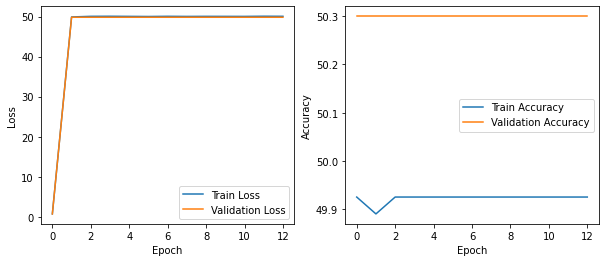

In [11]:
model = MyModel()
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.1)
criterion = nn.BCELoss()

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            labels = labels.float()  # Ensure labels are float for BCELoss
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            predicted = torch.round(outputs)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    average_loss = total_loss / len(data_loader)
    accuracy = 100 * correct / total
    return average_loss, accuracy

# Evaluate the model initially
initial_train_loss, initial_train_accuracy = evaluate_model(model, train_loader, criterion, device)
initial_val_loss, initial_val_accuracy = evaluate_model(model, test_loader, criterion, device)

print_debug(f'Initial Train Loss: {initial_train_loss}, Initial Train Accuracy: {initial_train_accuracy}%')
print_debug(f'Initial Validation Loss: {initial_val_loss}, Initial Validation Accuracy: {initial_val_accuracy}%')

# Initialize lists for plotting
train_losses = [initial_train_loss]
val_losses = [initial_val_loss]
train_accuracies = [initial_train_accuracy]
val_accuracies = [initial_val_accuracy]

num_epochs = 150
best_val_loss = float('inf')
last_improvement = 0
patience = 10

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        if inputs is None:
            continue
        inputs, labels = inputs.to(device), labels.to(device)
        labels = labels.float()
        optimizer.zero_grad()
        outputs = model(inputs)
        outputs = outputs.squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        predicted = (outputs > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss /= len(train_loader)
    train_accuracy = 100 * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    print_debug(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%.")

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            if inputs is None:
                continue
            inputs, labels = inputs.to(device), labels.to(device)
            labels = labels.float()
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    print_debug(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%.")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        last_improvement = epoch
        torch.save(model.state_dict(), '/home/semc/Aygul_DL/Deep-learning/kaggle/model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_1.pth')
        print_debug(f"Model improved and saved at epoch {epoch+1} into the file model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_1.pth.")

    if epoch - last_improvement > patience:
        print_debug("No improvement in validation loss for several epochs, stopping training.")
        break

# Calculate the actual number of epochs data was collected
actual_num_epochs = len(train_losses)  # Assuming train_losses and val_losses are updated every epoch

plt.figure(figsize=(10, 4))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(range(actual_num_epochs), train_losses, label='Train Loss')
plt.plot(range(actual_num_epochs), val_losses, label='Validation Loss')
plt.xlabel('Epoch', color='black')
plt.ylabel('Loss', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(actual_num_epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(actual_num_epochs), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch', color='black')
plt.ylabel('Accuracy', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

plt.show()

2024-05-13 14:50:35 - DEBUG: Initial Train Loss: 0.6931257346948496, Initial Train Accuracy: 50.13501350135014%
2024-05-13 14:50:35 - DEBUG: Initial Validation Loss: 0.6930210628087008, Initial Validation Accuracy: 50.56%
2024-05-13 14:50:59 - DEBUG: Epoch 1, Train Loss: 49.7583, Train Accuracy: 50.07%.
2024-05-13 14:51:03 - DEBUG: Validation Loss: 49.8418, Validation Accuracy: 50.30%.
2024-05-13 14:51:03 - DEBUG: Model improved and saved at epoch 1 into the file model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_01.pth.
2024-05-13 14:51:27 - DEBUG: Epoch 2, Train Loss: 50.0631, Train Accuracy: 49.93%.
2024-05-13 14:51:30 - DEBUG: Validation Loss: 49.8418, Validation Accuracy: 50.30%.
2024-05-13 14:51:54 - DEBUG: Epoch 3, Train Loss: 50.0885, Train Accuracy: 49.91%.
2024-05-13 14:51:58 - DEBUG: Validation Loss: 49.8418, Validation Accuracy: 50.30%.
2024-05-13 14:52:22 - DEBUG: Epoch 4, Train Loss: 49.7780, Train Accuracy: 50.19%.
2024-05-13 14:52:25 - DEBUG: Valid

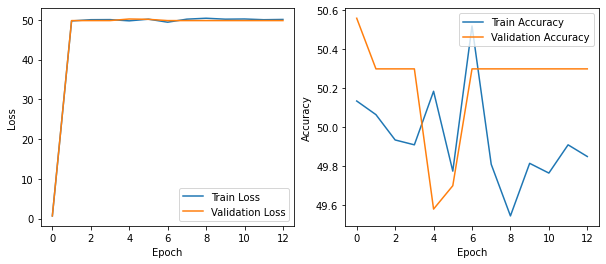

In [18]:
model = MyModel()
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.01)
criterion = nn.BCELoss()

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            labels = labels.float()  # Ensure labels are float for BCELoss
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            predicted = torch.round(outputs)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    average_loss = total_loss / len(data_loader)
    accuracy = 100 * correct / total
    return average_loss, accuracy

# Evaluate the model initially
initial_train_loss, initial_train_accuracy = evaluate_model(model, train_loader, criterion, device)
initial_val_loss, initial_val_accuracy = evaluate_model(model, test_loader, criterion, device)

print_debug(f'Initial Train Loss: {initial_train_loss}, Initial Train Accuracy: {initial_train_accuracy}%')
print_debug(f'Initial Validation Loss: {initial_val_loss}, Initial Validation Accuracy: {initial_val_accuracy}%')

# Initialize lists for plotting
train_losses = [initial_train_loss]
val_losses = [initial_val_loss]
train_accuracies = [initial_train_accuracy]
val_accuracies = [initial_val_accuracy]

num_epochs = 150
best_val_loss = float('inf')
last_improvement = 0
patience = 10

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        if inputs is None:
            continue
        inputs, labels = inputs.to(device), labels.to(device)
        labels = labels.float()
        optimizer.zero_grad()
        outputs = model(inputs)
        outputs = outputs.squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        predicted = (outputs > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss /= len(train_loader)
    train_accuracy = 100 * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    print_debug(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%.")

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            if inputs is None:
                continue
            inputs, labels = inputs.to(device), labels.to(device)
            labels = labels.float()
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    print_debug(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%.")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        last_improvement = epoch
        torch.save(model.state_dict(), '/home/semc/Aygul_DL/Deep-learning/kaggle/model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_01.pth')
        print_debug(f"Model improved and saved at epoch {epoch+1} into the file model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_01.pth.")

    if epoch - last_improvement > patience:
        print_debug("No improvement in validation loss for several epochs, stopping training.")
        break

# Calculate the actual number of epochs data was collected
actual_num_epochs = len(train_losses)  # Assuming train_losses and val_losses are updated every epoch

plt.figure(figsize=(10, 4))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(range(actual_num_epochs), train_losses, label='Train Loss')
plt.plot(range(actual_num_epochs), val_losses, label='Validation Loss')
plt.xlabel('Epoch', color='black')
plt.ylabel('Loss', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(actual_num_epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(actual_num_epochs), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch', color='black')
plt.ylabel('Accuracy', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

plt.show()

2024-05-09 13:04:16 - DEBUG: Initial Train Loss: 0.6939567055184239, Initial Train Accuracy: 50.075007500750075%
2024-05-09 13:04:16 - DEBUG: Initial Validation Loss: 0.6940870081322102, Initial Validation Accuracy: 49.7%
2024-05-09 13:04:40 - DEBUG: Epoch 1, Train Loss: 14.8116, Train Accuracy: 51.91%.
2024-05-09 13:04:43 - DEBUG: Validation Loss: 0.6871, Validation Accuracy: 53.18%.
2024-05-09 13:04:43 - DEBUG: Model improved and saved at epoch 1 into the file model5_with_augmentation_lr0_001.pth.
2024-05-09 13:05:07 - DEBUG: Epoch 2, Train Loss: 0.6867, Train Accuracy: 53.58%.
2024-05-09 13:05:10 - DEBUG: Validation Loss: 0.6867, Validation Accuracy: 57.36%.
2024-05-09 13:05:11 - DEBUG: Model improved and saved at epoch 2 into the file model5_with_augmentation_lr0_001.pth.
2024-05-09 13:05:34 - DEBUG: Epoch 3, Train Loss: 0.6836, Train Accuracy: 55.59%.
2024-05-09 13:05:38 - DEBUG: Validation Loss: 0.6498, Validation Accuracy: 61.02%.
2024-05-09 13:05:38 - DEBUG: Model improved and 

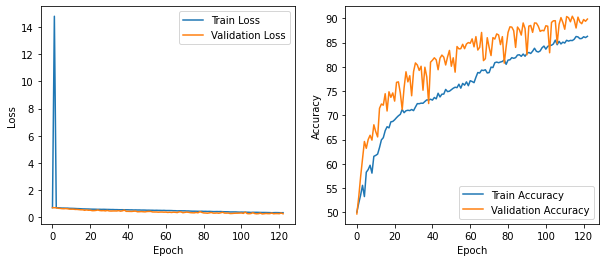

In [13]:
model = MyModel()
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.BCELoss()

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            labels = labels.float()  # Ensure labels are float for BCELoss
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            predicted = torch.round(outputs)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    average_loss = total_loss / len(data_loader)
    accuracy = 100 * correct / total
    return average_loss, accuracy

# Evaluate the model initially
initial_train_loss, initial_train_accuracy = evaluate_model(model, train_loader, criterion, device)
initial_val_loss, initial_val_accuracy = evaluate_model(model, test_loader, criterion, device)

print_debug(f'Initial Train Loss: {initial_train_loss}, Initial Train Accuracy: {initial_train_accuracy}%')
print_debug(f'Initial Validation Loss: {initial_val_loss}, Initial Validation Accuracy: {initial_val_accuracy}%')

# Initialize lists for plotting
train_losses = [initial_train_loss]
val_losses = [initial_val_loss]
train_accuracies = [initial_train_accuracy]
val_accuracies = [initial_val_accuracy]

num_epochs = 150
best_val_loss = float('inf')
last_improvement = 0
patience = 10

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        if inputs is None:
            continue
        inputs, labels = inputs.to(device), labels.to(device)
        labels = labels.float()
        optimizer.zero_grad()
        outputs = model(inputs)
        outputs = outputs.squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        predicted = (outputs > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss /= len(train_loader)
    train_accuracy = 100 * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    print_debug(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%.")

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            if inputs is None:
                continue
            inputs, labels = inputs.to(device), labels.to(device)
            labels = labels.float()
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    print_debug(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%.")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        last_improvement = epoch
        torch.save(model.state_dict(), '/home/semc/Aygul_DL/Deep-learning/kaggle/model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_001.pth')
        print_debug(f"Model improved and saved at epoch {epoch+1} into the file model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_001.pth.")

    if epoch - last_improvement > patience:
        print_debug("No improvement in validation loss for several epochs, stopping training.")
        break

# Calculate the actual number of epochs data was collected
actual_num_epochs = len(train_losses)  # Assuming train_losses and val_losses are updated every epoch

plt.figure(figsize=(10, 4))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(range(actual_num_epochs), train_losses, label='Train Loss')
plt.plot(range(actual_num_epochs), val_losses, label='Validation Loss')
plt.xlabel('Epoch', color='black')
plt.ylabel('Loss', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(actual_num_epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(actual_num_epochs), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch', color='black')
plt.ylabel('Accuracy', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

plt.show()

2024-05-09 14:10:19 - DEBUG: Initial Train Loss: 0.6939323256952694, Initial Train Accuracy: 50.075007500750075%
2024-05-09 14:10:19 - DEBUG: Initial Validation Loss: 0.6945180968393253, Initial Validation Accuracy: 49.7%
2024-05-09 14:10:43 - DEBUG: Epoch 1, Train Loss: 0.7148, Train Accuracy: 58.74%.
2024-05-09 14:10:46 - DEBUG: Validation Loss: 0.6152, Validation Accuracy: 68.42%.
2024-05-09 14:10:46 - DEBUG: Model improved and saved at epoch 1 into the file model5_with_augmentation_lr0_0001.pth.
2024-05-09 14:11:10 - DEBUG: Epoch 2, Train Loss: 0.6344, Train Accuracy: 64.12%.
2024-05-09 14:11:13 - DEBUG: Validation Loss: 0.5666, Validation Accuracy: 70.76%.
2024-05-09 14:11:14 - DEBUG: Model improved and saved at epoch 2 into the file model5_with_augmentation_lr0_0001.pth.
2024-05-09 14:11:37 - DEBUG: Epoch 3, Train Loss: 0.6073, Train Accuracy: 66.27%.
2024-05-09 14:11:41 - DEBUG: Validation Loss: 0.5805, Validation Accuracy: 67.92%.
2024-05-09 14:12:04 - DEBUG: Epoch 4, Train Los

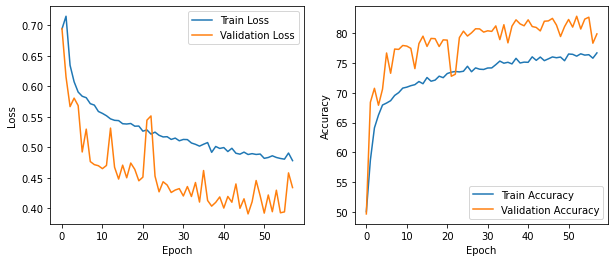

In [15]:
model = MyModel()
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.BCELoss()

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            labels = labels.float()  # Ensure labels are float for BCELoss
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            predicted = torch.round(outputs)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    average_loss = total_loss / len(data_loader)
    accuracy = 100 * correct / total
    return average_loss, accuracy

# Evaluate the model initially
initial_train_loss, initial_train_accuracy = evaluate_model(model, train_loader, criterion, device)
initial_val_loss, initial_val_accuracy = evaluate_model(model, test_loader, criterion, device)

print_debug(f'Initial Train Loss: {initial_train_loss}, Initial Train Accuracy: {initial_train_accuracy}%')
print_debug(f'Initial Validation Loss: {initial_val_loss}, Initial Validation Accuracy: {initial_val_accuracy}%')

# Initialize lists for plotting
train_losses = [initial_train_loss]
val_losses = [initial_val_loss]
train_accuracies = [initial_train_accuracy]
val_accuracies = [initial_val_accuracy]

num_epochs = 150
best_val_loss = float('inf')
last_improvement = 0
patience = 10

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        if inputs is None:
            continue
        inputs, labels = inputs.to(device), labels.to(device)
        labels = labels.float()
        optimizer.zero_grad()
        outputs = model(inputs)
        outputs = outputs.squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        predicted = (outputs > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss /= len(train_loader)
    train_accuracy = 100 * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    print_debug(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%.")

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            if inputs is None:
                continue
            inputs, labels = inputs.to(device), labels.to(device)
            labels = labels.float()
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    print_debug(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%.")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        last_improvement = epoch
        torch.save(model.state_dict(), '/home/semc/Aygul_DL/Deep-learning/kaggle/model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_0001.pth')
        print_debug(f"Model improved and saved at epoch {epoch+1} into the file model5_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_0001.pth.")

    if epoch - last_improvement > patience:
        print_debug("No improvement in validation loss for several epochs, stopping training.")
        break

# Calculate the actual number of epochs data was collected
actual_num_epochs = len(train_losses)  # Assuming train_losses and val_losses are updated every epoch

plt.figure(figsize=(10, 4))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(range(actual_num_epochs), train_losses, label='Train Loss')
plt.plot(range(actual_num_epochs), val_losses, label='Validation Loss')
plt.xlabel('Epoch', color='black')
plt.ylabel('Loss', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(actual_num_epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(actual_num_epochs), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch', color='black')
plt.ylabel('Accuracy', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

plt.show()

2024-05-09 15:06:00 - DEBUG: Initial Train Loss: 0.6930975020883944, Initial Train Accuracy: 49.92999299929993%
2024-05-09 15:06:00 - DEBUG: Initial Validation Loss: 0.6927893969077098, Initial Validation Accuracy: 50.36%
2024-05-09 15:06:24 - DEBUG: Epoch 1, Train Loss: 0.6631, Train Accuracy: 59.27%.
2024-05-09 15:06:27 - DEBUG: Validation Loss: 0.6231, Validation Accuracy: 64.96%.
2024-05-09 15:06:27 - DEBUG: Model improved and saved at epoch 1 into the file model_with_augmentation_lr0_00001.pth.
2024-05-09 15:06:51 - DEBUG: Epoch 2, Train Loss: 0.6396, Train Accuracy: 63.09%.
2024-05-09 15:06:54 - DEBUG: Validation Loss: 0.6221, Validation Accuracy: 62.96%.
2024-05-09 15:06:55 - DEBUG: Model improved and saved at epoch 2 into the file model_with_augmentation_lr0_00001.pth.
2024-05-09 15:07:18 - DEBUG: Epoch 3, Train Loss: 0.6268, Train Accuracy: 64.18%.
2024-05-09 15:07:22 - DEBUG: Validation Loss: 0.5847, Validation Accuracy: 68.74%.
2024-05-09 15:07:22 - DEBUG: Model improved and

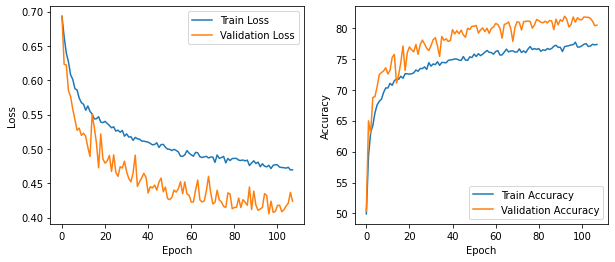

In [16]:
model = MyModel()
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.00001)
criterion = nn.BCELoss()

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            labels = labels.float()  # Ensure labels are float for BCELoss
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            predicted = torch.round(outputs)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    average_loss = total_loss / len(data_loader)
    accuracy = 100 * correct / total
    return average_loss, accuracy

# Evaluate the model initially
initial_train_loss, initial_train_accuracy = evaluate_model(model, train_loader, criterion, device)
initial_val_loss, initial_val_accuracy = evaluate_model(model, test_loader, criterion, device)

print_debug(f'Initial Train Loss: {initial_train_loss}, Initial Train Accuracy: {initial_train_accuracy}%')
print_debug(f'Initial Validation Loss: {initial_val_loss}, Initial Validation Accuracy: {initial_val_accuracy}%')

# Initialize lists for plotting
train_losses = [initial_train_loss]
val_losses = [initial_val_loss]
train_accuracies = [initial_train_accuracy]
val_accuracies = [initial_val_accuracy]

num_epochs = 150
best_val_loss = float('inf')
last_improvement = 0
patience = 10

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        if inputs is None:
            continue
        inputs, labels = inputs.to(device), labels.to(device)
        labels = labels.float()
        optimizer.zero_grad()
        outputs = model(inputs)
        outputs = outputs.squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        predicted = (outputs > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss /= len(train_loader)
    train_accuracy = 100 * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    print_debug(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%.")

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            if inputs is None:
                continue
            inputs, labels = inputs.to(device), labels.to(device)
            labels = labels.float()
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    print_debug(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%.")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        last_improvement = epoch
        torch.save(model.state_dict(), '/home/semc/Aygul_DL/Deep-learning/kaggle/model_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_00001.pth')
        print_debug(f"Model improved and saved at epoch {epoch+1} into the file model_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_00001.pth.")

    if epoch - last_improvement > patience:
        print_debug("No improvement in validation loss for several epochs, stopping training.")
        break

# Calculate the actual number of epochs data was collected
actual_num_epochs = len(train_losses)  # Assuming train_losses and val_losses are updated every epoch

plt.figure(figsize=(10, 4))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(range(actual_num_epochs), train_losses, label='Train Loss')
plt.plot(range(actual_num_epochs), val_losses, label='Validation Loss')
plt.xlabel('Epoch', color='black')
plt.ylabel('Loss', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(actual_num_epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(actual_num_epochs), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch', color='black')
plt.ylabel('Accuracy', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

plt.show()

In [12]:
model = MyModel()
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.000001)
criterion = nn.BCELoss()

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            labels = labels.float()  # Ensure labels are float for BCELoss
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            predicted = torch.round(outputs)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    average_loss = total_loss / len(data_loader)
    accuracy = 100 * correct / total
    return average_loss, accuracy

# Evaluate the model initially
initial_train_loss, initial_train_accuracy = evaluate_model(model, train_loader, criterion, device)
initial_val_loss, initial_val_accuracy = evaluate_model(model, test_loader, criterion, device)

print_debug(f'Initial Train Loss: {initial_train_loss}, Initial Train Accuracy: {initial_train_accuracy}%')
print_debug(f'Initial Validation Loss: {initial_val_loss}, Initial Validation Accuracy: {initial_val_accuracy}%')

# Initialize lists for plotting
train_losses = [initial_train_loss]
val_losses = [initial_val_loss]
train_accuracies = [initial_train_accuracy]
val_accuracies = [initial_val_accuracy]

num_epochs = 150
best_val_loss = float('inf')
last_improvement = 0
patience = 10

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        if inputs is None:
            continue
        inputs, labels = inputs.to(device), labels.to(device)
        labels = labels.float()
        optimizer.zero_grad()
        outputs = model(inputs)
        outputs = outputs.squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        predicted = (outputs > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss /= len(train_loader)
    train_accuracy = 100 * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    print_debug(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%.")

    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            if inputs is None:
                continue
            inputs, labels = inputs.to(device), labels.to(device)
            labels = labels.float()
            outputs = model(inputs)
            outputs = outputs.squeeze(1)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            predicted = (outputs > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss /= len(test_loader)
    val_accuracy = 100 * val_correct / val_total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)
    print_debug(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%.")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        last_improvement = epoch
        torch.save(model.state_dict(), '/home/semc/Aygul_DL/Deep-learning/kaggle/model_withAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_000001.pth')
        print_debug(f"Model improved and saved at epoch {epoch+1} into the file model_wwithAgmentation_withBatchnorm_withDropoutLayers_withEarlyStop_lr0_000001.pth.")

    if epoch - last_improvement > patience:
        print_debug("No improvement in validation loss for several epochs, stopping training.")
        break

# Calculate the actual number of epochs data was collected
actual_num_epochs = len(train_losses)  # Assuming train_losses and val_losses are updated every epoch

plt.figure(figsize=(10, 4))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(range(actual_num_epochs), train_losses, label='Train Loss')
plt.plot(range(actual_num_epochs), val_losses, label='Validation Loss')
plt.xlabel('Epoch', color='black')
plt.ylabel('Loss', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(actual_num_epochs), train_accuracies, label='Train Accuracy')
plt.plot(range(actual_num_epochs), val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch', color='black')
plt.ylabel('Accuracy', color='black')
plt.tick_params(axis='both', colors='black')
plt.legend()

plt.show()

2024-05-12 16:16:50 - DEBUG: Initial Train Loss: 0.6943980255446875, Initial Train Accuracy: 49.924992499249925%
2024-05-12 16:16:50 - DEBUG: Initial Validation Loss: 0.6940304863302014, Initial Validation Accuracy: 50.3%
2024-05-12 16:17:14 - DEBUG: Epoch 1, Train Loss: 0.6735, Train Accuracy: 57.56%.
2024-05-12 16:17:18 - DEBUG: Validation Loss: 0.6477, Validation Accuracy: 63.54%.
2024-05-12 16:17:18 - DEBUG: Model improved and saved at epoch 1 into the file model_with_augmentation_lr0_000001.pth.
2024-05-12 16:17:42 - DEBUG: Epoch 2, Train Loss: 0.6554, Train Accuracy: 61.03%.
2024-05-12 16:17:45 - DEBUG: Validation Loss: 0.6358, Validation Accuracy: 63.18%.
2024-05-12 16:17:45 - DEBUG: Model improved and saved at epoch 2 into the file model_with_augmentation_lr0_000001.pth.
2024-05-12 16:18:09 - DEBUG: Epoch 3, Train Loss: 0.6473, Train Accuracy: 62.02%.
2024-05-12 16:18:13 - DEBUG: Validation Loss: 0.6246, Validation Accuracy: 65.32%.
2024-05-12 16:18:13 - DEBUG: Model improved a

KeyboardInterrupt: 

# Model model5_with_augmentation_lr0_001.pth gives the best results so far.

Adjust treshold of output layer (default is 0.5).

Image 9774.jpg: Predicted label is cat
Image 4328.jpg: Predicted label is cat
Image 9772.jpg: Predicted label is cat
Image 9853.jpg: Predicted label is cat
Image 4605.jpg: Predicted label is cat
Image 9773.jpg: Predicted label is cat
Image 4327.jpg: Predicted label is cat
Image 9771.jpg: Predicted label is cat
Image 4325.jpg: Predicted label is cat
Image 4602.jpg: Predicted label is cat
Image 4324.jpg: Predicted label is cat
Image 4606.jpg: Predicted label is cat
Image 4326.jpg: Predicted label is cat
Image 9775.jpg: Predicted label is cat
Image 9849.jpg: Predicted label is cat
Image 4603.jpg: Predicted label is cat
Image 985.jpg: Predicted label is cat
Image 9851.jpg: Predicted label is cat
Image 4323.jpg: Predicted label is cat
Image 9850.jpg: Predicted label is cat
Image 4604.jpg: Predicted label is cat
Image 9852.jpg: Predicted label is cat


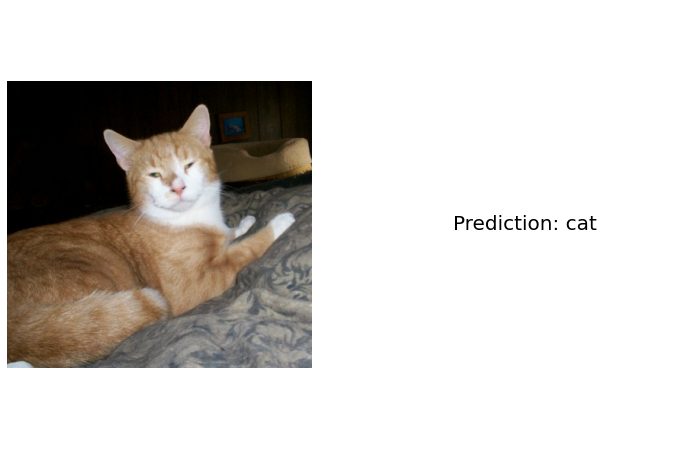

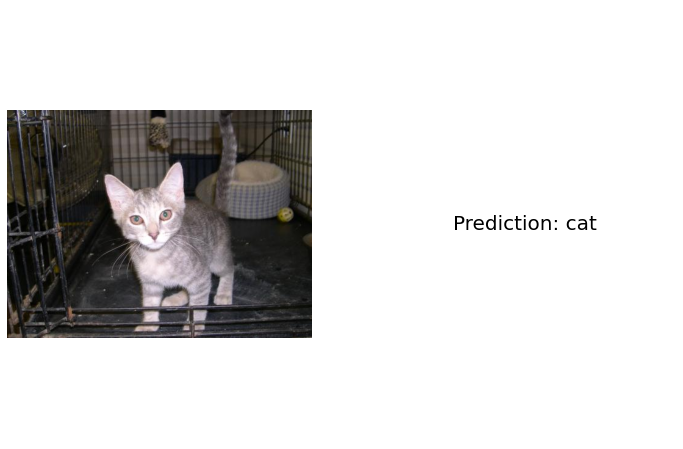

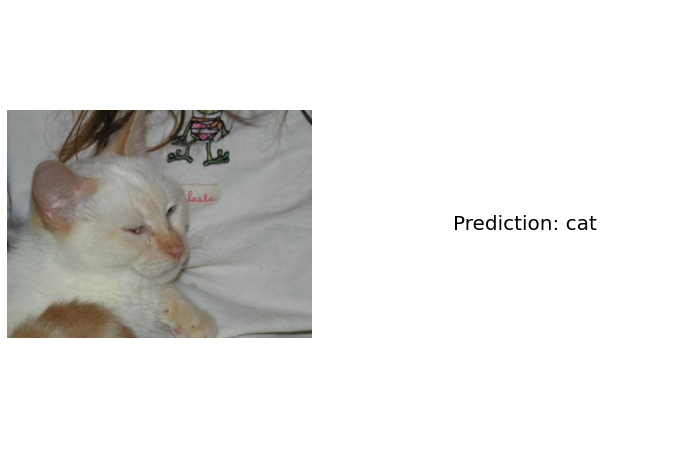

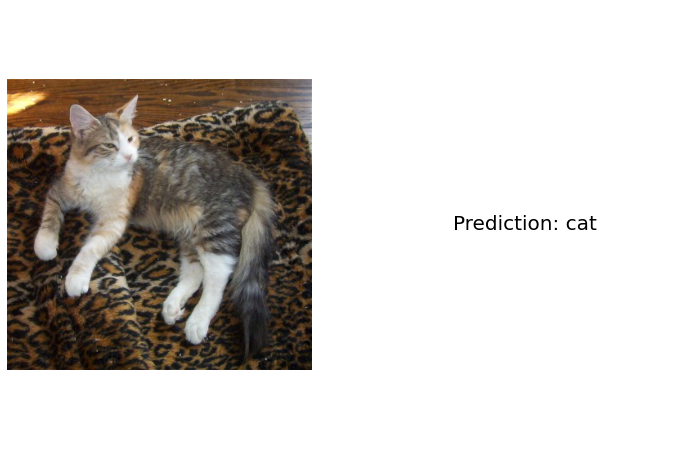

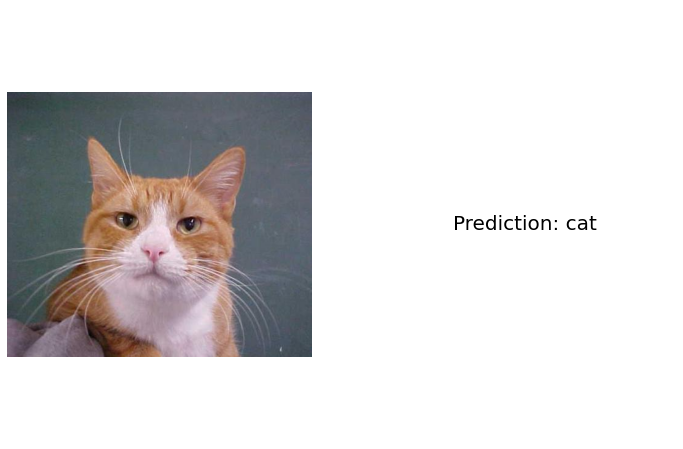

...

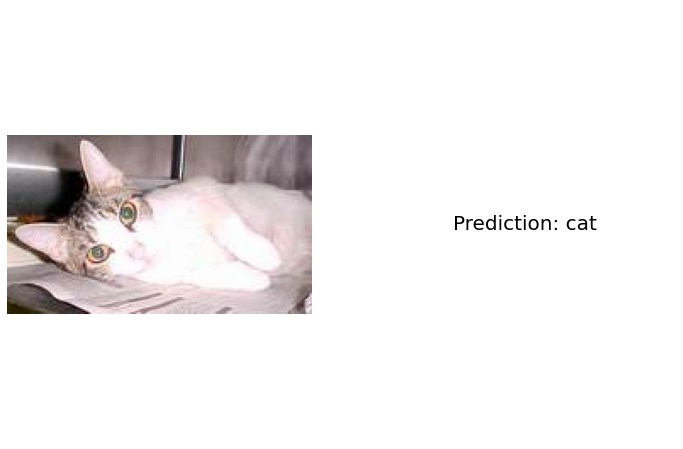

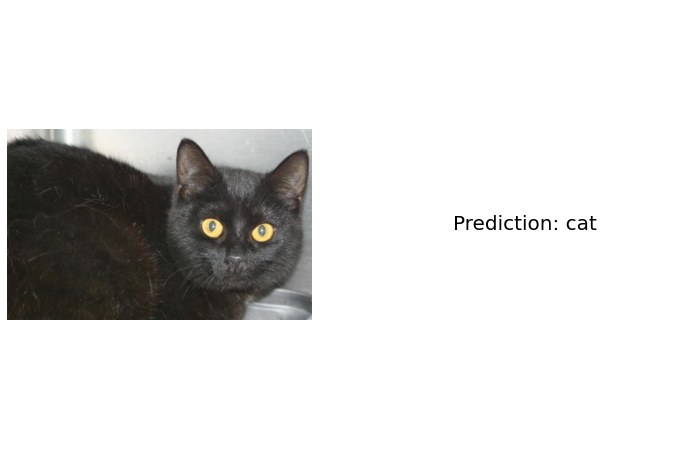

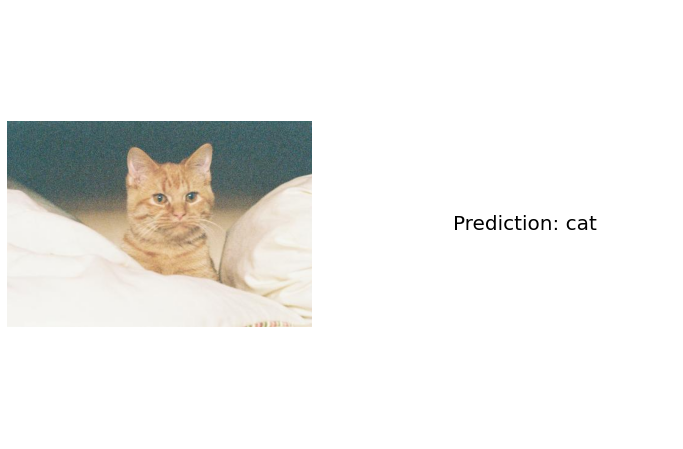

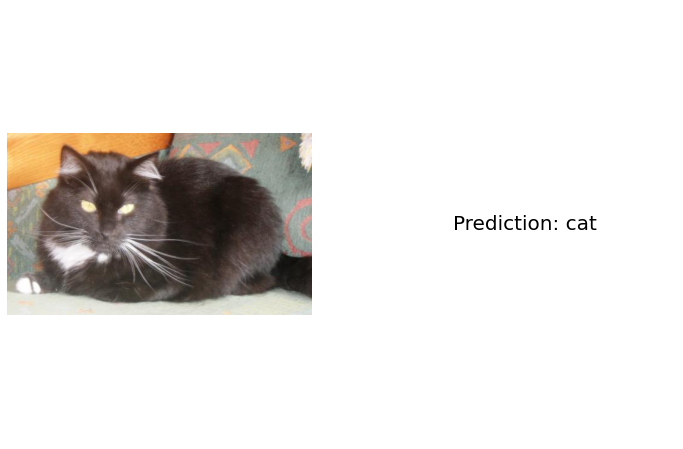

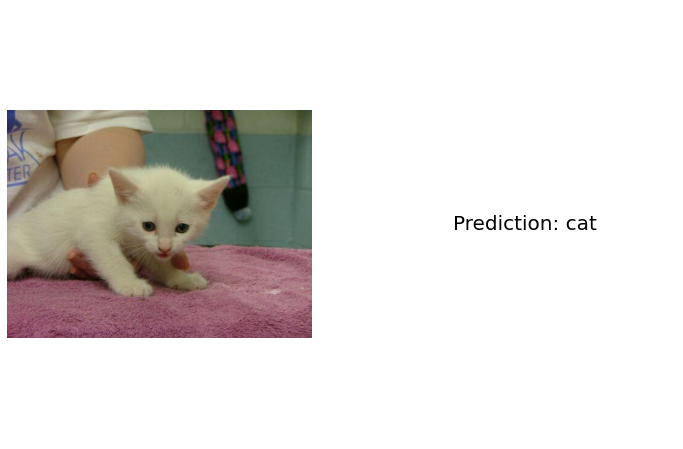

In [14]:
# Load model function that adapts to whether the model was trained with DataParallel
def load_model(model_path, model, device):
    state_dict = torch.load(model_path, map_location="cpu")
    new_state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
    model.load_state_dict(new_state_dict)
    model = model.to(device)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = '/home/semc/Aygul_DL/Deep-learning/kaggle/model_with_augmentation_lr0_001.pth'
model = MyModel()
model = load_model(model_path, model, device)

# Define the image transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4883, 0.4553, 0.4171], std=[0.2598, 0.2531, 0.2558])
])

def predict_image(model, image_path, transform, device):
    image = Image.open(image_path)
    image = transform(image).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        output = model(image)
        prediction = torch.sigmoid(output).item()
        if prediction >= 0.68:
            label = "dog"
        else:
            label = "cat"
    return label

# Path to your image folder
folder_path = "/home/semc/Aygul_DL/Deep-learning/Cats"

# Iterate over all images in the folder
results = {}
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(folder_path, filename)
        prediction = predict_image(model, image_path, transform, device)
        results[filename] = prediction

# Print results
for filename, prediction in results.items():
    print(f"Image {filename}: Predicted label is {prediction}")

# Iterate over all images in the folder
results = {}
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(folder_path, filename)
        prediction = predict_image(model, image_path, transform, device)
        results[filename] = prediction

# Print results and display images
for filename, prediction in results.items():
    image_path = os.path.join(folder_path, filename)
    image = Image.open(image_path)

    # Display the image
    plt.figure(figsize=(12, 8))  # Adjust the figure size to make the image larger
    plt.subplot(1, 2, 1)  # Create a subplot for the image
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 2, 2)  # Create a subplot for the prediction text
    plt.text(0.5, 0.5, f"Prediction: {prediction}", color='Black', fontsize=20, ha='center', va='center')
    plt.axis('off')

    # Show the image with the predicted label
    plt.show()

Image 9847.jpg: Predicted label is dog
Image 9831.jpg: Predicted label is dog
Image 9845.jpg: Predicted label is dog
Image 9837.jpg: Predicted label is dog
Image 984.jpg: Predicted label is dog
Image 9829.jpg: Predicted label is dog
Image 9844.jpg: Predicted label is dog
Image 983.jpg: Predicted label is dog
Image 9841.jpg: Predicted label is dog
Image 9832.jpg: Predicted label is dog
Image 9846.jpg: Predicted label is dog
Image 9830.jpg: Predicted label is dog
Image 9836.jpg: Predicted label is dog
Image 9835.jpg: Predicted label is dog
Image 9838.jpg: Predicted label is dog
Image 9839.jpg: Predicted label is dog
Image 9848.jpg: Predicted label is dog
Image 9842.jpg: Predicted label is dog
Image 9834.jpg: Predicted label is dog
Image 9833.jpg: Predicted label is dog
Image 9840.jpg: Predicted label is dog
Image 9843.jpg: Predicted label is dog


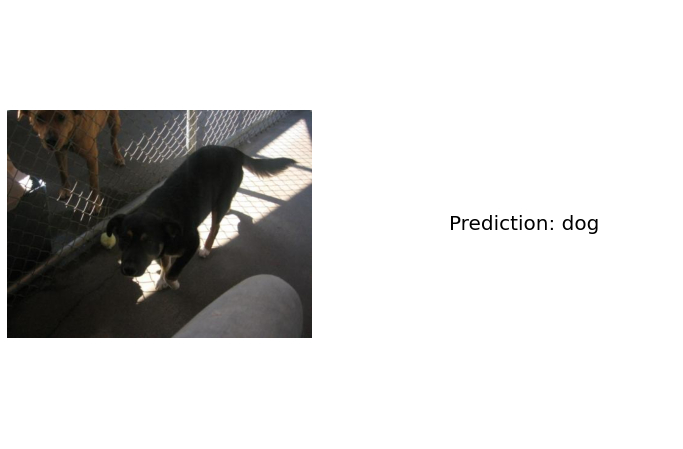

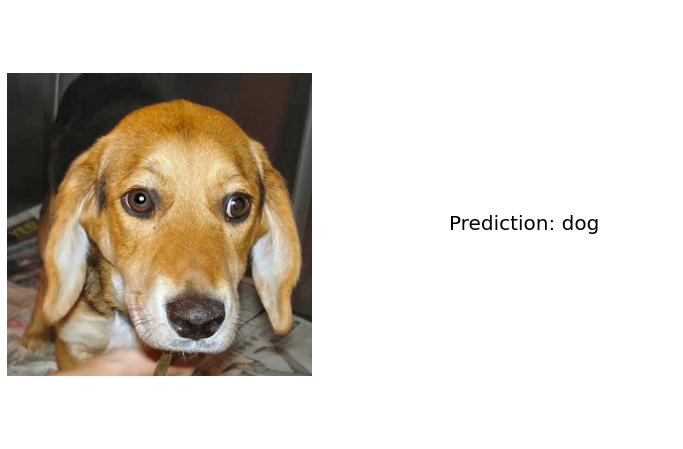

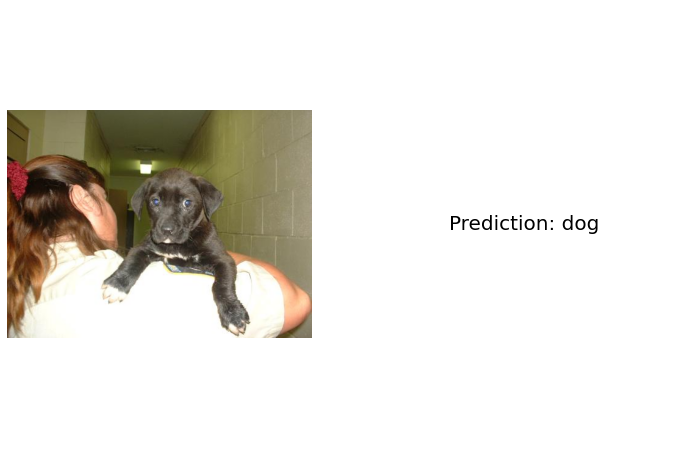

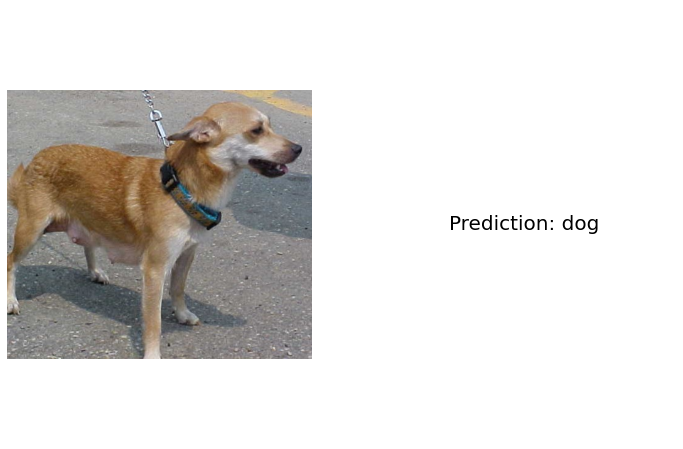

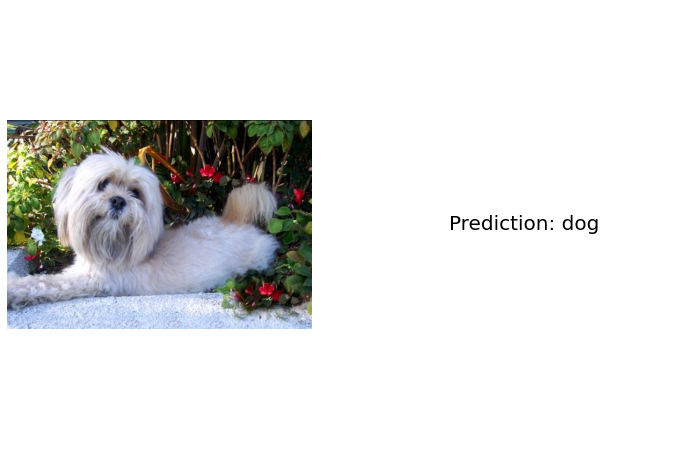

...

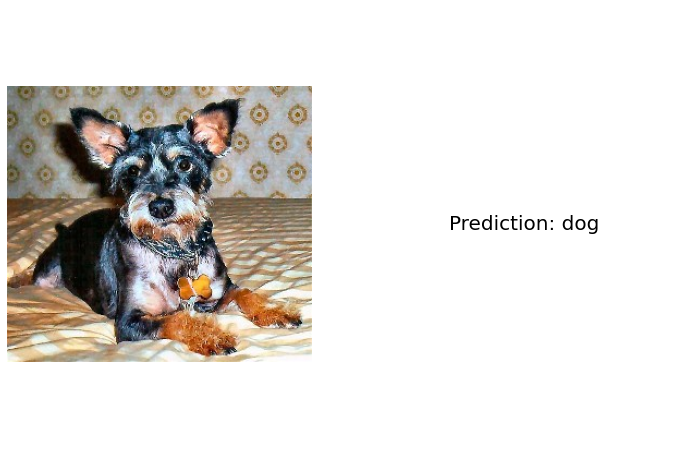

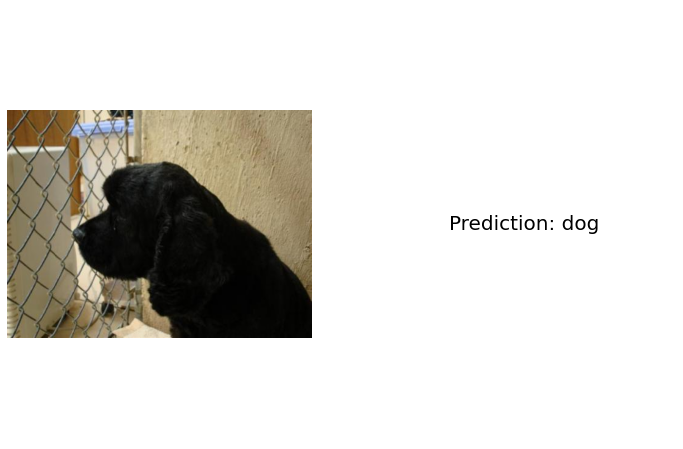

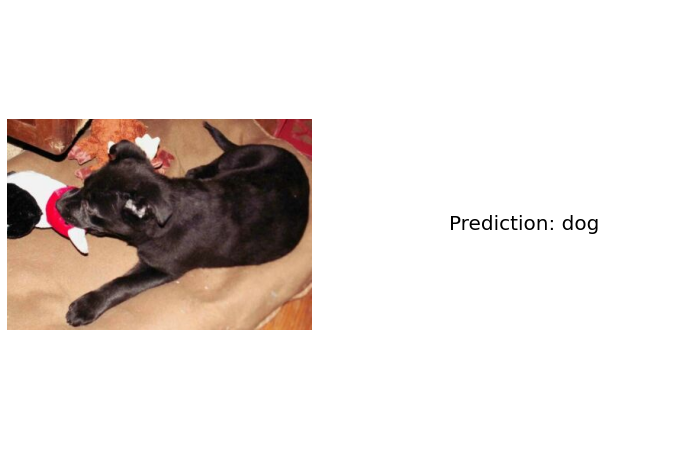

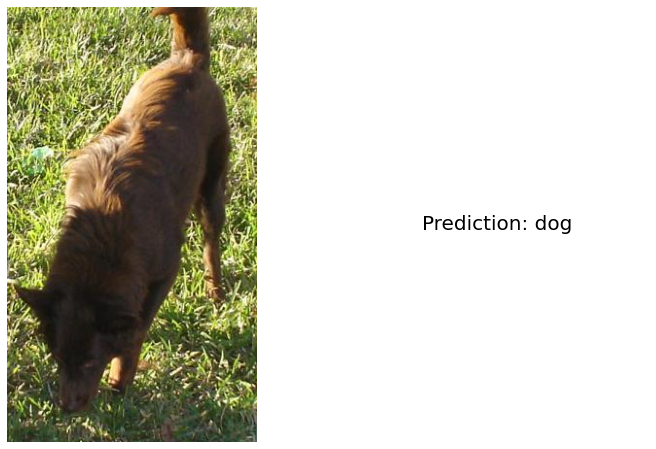

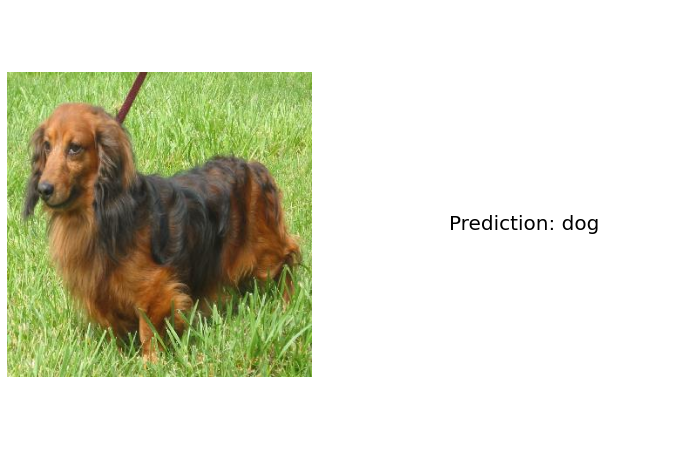

In [15]:
# Load model function that adapts to whether the model was trained with DataParallel
def load_model(model_path, model, device):
    state_dict = torch.load(model_path, map_location="cpu")
    new_state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
    model.load_state_dict(new_state_dict)
    model = model.to(device)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = '/home/semc/Aygul_DL/Deep-learning/kaggle/model_with_augmentation_lr0_001.pth'
model = MyModel()
model = load_model(model_path, model, device)

# Define the image transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4883, 0.4553, 0.4171], std=[0.2598, 0.2531, 0.2558])
])

def predict_image(model, image_path, transform, device):
    image = Image.open(image_path)
    image = transform(image).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        output = model(image)
        prediction = torch.sigmoid(output).item()
        if prediction > 0.68:
            label = "dog"
        else:
            label = "cat"
    return label

# Path to your image folder
folder_path = "/home/semc/Aygul_DL/Deep-learning/Dogs"

# Iterate over all images in the folder
results = {}
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(folder_path, filename)
        prediction = predict_image(model, image_path, transform, device)
        results[filename] = prediction

# Print results
for filename, prediction in results.items():
    print(f"Image {filename}: Predicted label is {prediction}")

# Iterate over all images in the folder
results = {}
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(folder_path, filename)
        prediction = predict_image(model, image_path, transform, device)
        results[filename] = prediction

# Print results and display images
for filename, prediction in results.items():
    image_path = os.path.join(folder_path, filename)
    image = Image.open(image_path)

    # Display the image
    plt.figure(figsize=(12, 8))  # Adjust the figure size to make the image larger
    plt.subplot(1, 2, 1)  # Create a subplot for the image
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 2, 2)  # Create a subplot for the prediction text
    plt.text(0.5, 0.5, f"Prediction: {prediction}", color='Black', fontsize=20, ha='center', va='center')
    plt.axis('off')

    # Show the image with the predicted label
    plt.show()

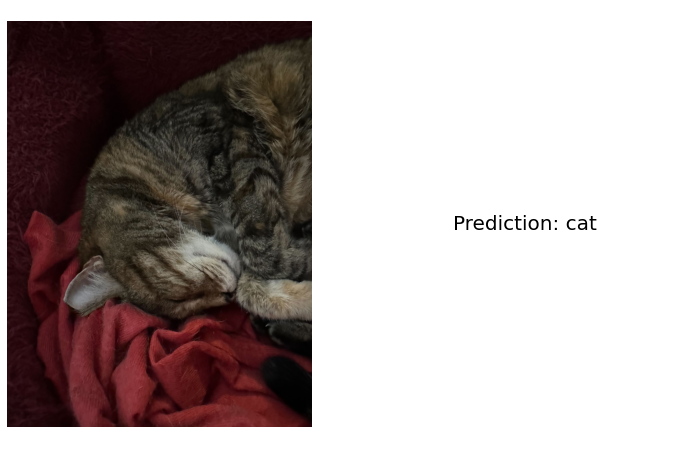

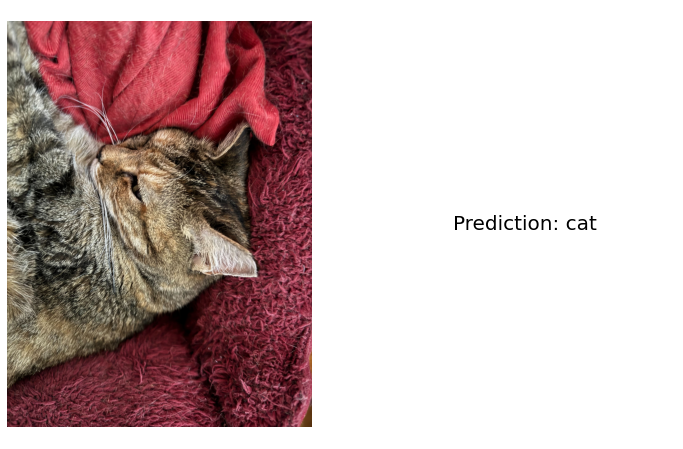

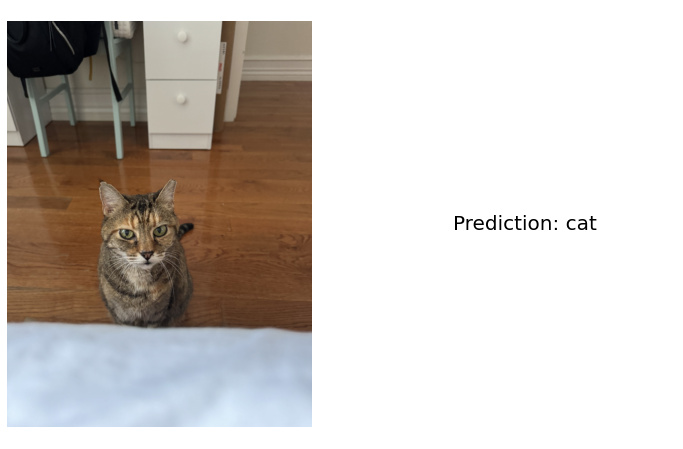

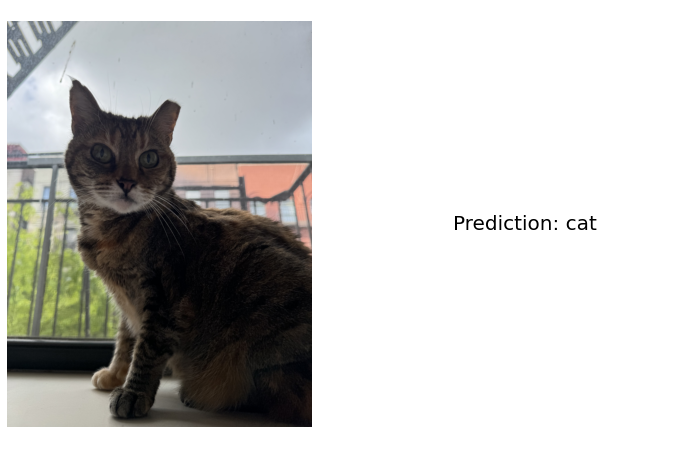

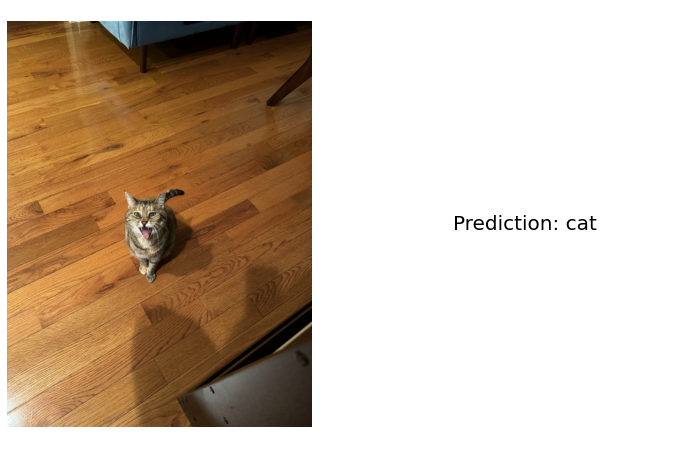

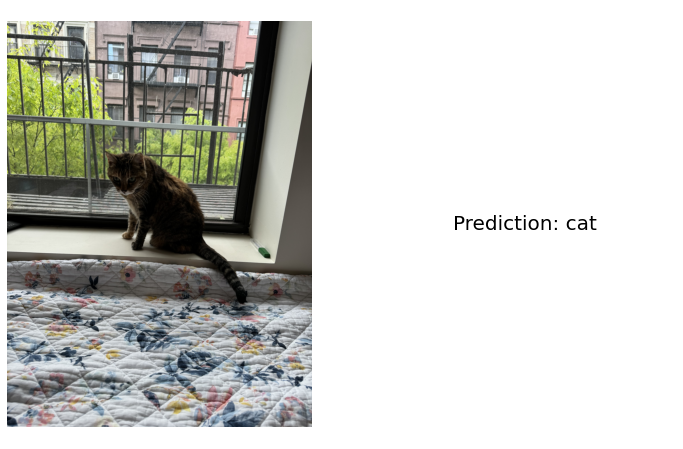

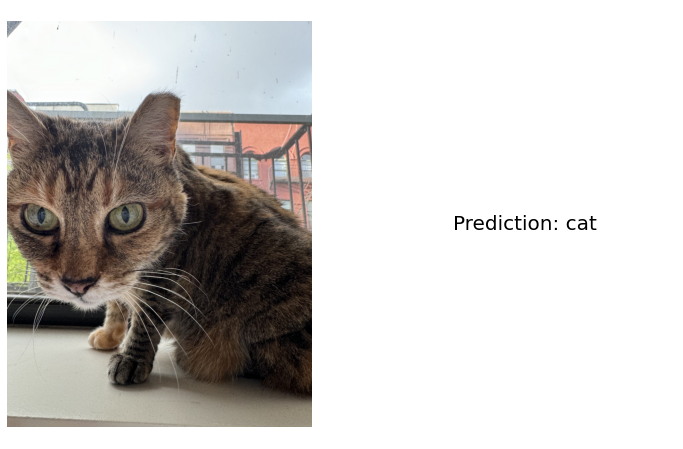

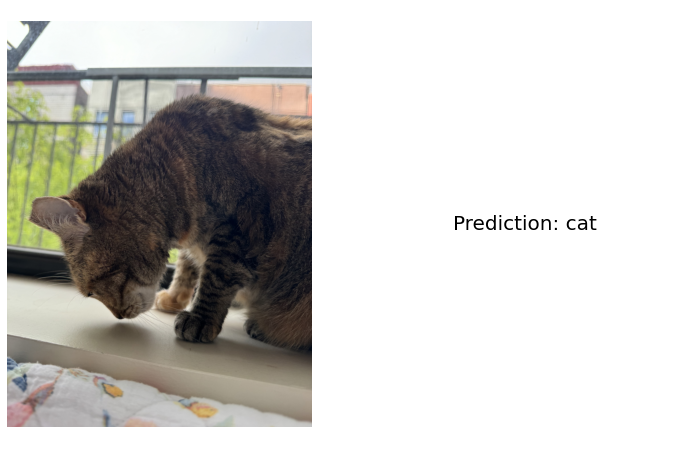

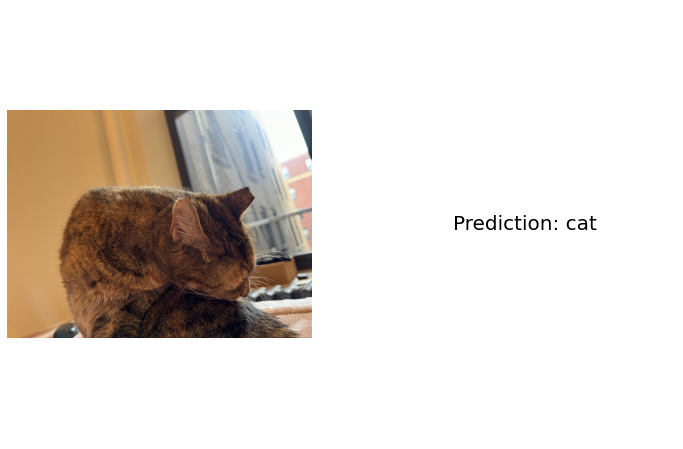

In [17]:
#Test model on images of my cat Miss Cat:

# Load model function that adapts to whether the model was trained with DataParallel
def load_model(model_path, model, device):
    state_dict = torch.load(model_path, map_location="cpu")
    new_state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
    model.load_state_dict(new_state_dict)
    model = model.to(device)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = '/home/semc/Aygul_DL/Deep-learning/kaggle/model_with_augmentation_lr0_001.pth'
model = MyModel()
model = load_model(model_path, model, device)

# Define the image transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4883, 0.4553, 0.4171], std=[0.2598, 0.2531, 0.2558])
])

def predict_image(model, image_path, transform, device):
    image = Image.open(image_path)
    image = transform(image).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        output = model(image)
        prediction = torch.sigmoid(output).item()
        if prediction > 0.68:
            label = "dog"
        else:
            label = "cat"
    return label

# Path to your image folder
folder_path = "/home/semc/Aygul_DL/Deep-learning/My_pet"

# Iterate over all images in the folder
results = {}
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(folder_path, filename)
        prediction = predict_image(model, image_path, transform, device)
        results[filename] = prediction

## Print results
#for filename, prediction in results.items():
#    print(f"Image {filename}: Predicted label is {prediction}")

# Iterate over all images in the folder
results = {}
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(folder_path, filename)
        prediction = predict_image(model, image_path, transform, device)
        results[filename] = prediction

# Print results and display images
for filename, prediction in results.items():
    image_path = os.path.join(folder_path, filename)
    image = Image.open(image_path)

    # Display the image
    plt.figure(figsize=(12, 8))  # Adjust the figure size to make the image larger
    plt.subplot(1, 2, 1)  # Create a subplot for the image
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 2, 2)  # Create a subplot for the prediction text
    plt.text(0.5, 0.5, f"Prediction: {prediction}", color='Black', fontsize=20, ha='center', va='center')
    plt.axis('off')

    # Show the image with the predicted label
    plt.show()